In this tutorial, we make an introduction to neural ordinary differential equations (NODEs) [[chen2018neural]](#References). A one-sentence summary of this model family is <br><br>

<div align="center">
  <strong> an ODE system in which the differential function is a neural network (NN). </strong>
</div>

We will start this tutorial with a discussion on ODEs. Instead of presenting techniqual details, we will give a practical introduction to ODEs. Next, we formally describe NODEs and show three standard use cases of ODEs: classification, normalizing flows and latent dynamics learning. The lecture will be closed by works that study different aspects of the vanilla NODEs.


#### Organization of the Lecture
0. Introduction (10min)
1. Formal descriptions of ODEs (20min)<br>
    1.1. Computing ODE solutions<br>
    1.2. Example: Van der Pol oscillator<br>
    1.3. Break: VDP & ODE integration parameters
2. Neural ODEs (20min)<br>
    2.1. Problem formulation<br>
    2.2. Maximum likelihood estimation<br>
    2.3. Example: learning VDP sequences with NODE<br>
    2.4. Break: Adjoints<br>
3. Latent Bayesian Neural ODEs (20min)<br>
    3.1. Variational Inference <br>
    3.2. Evidence Lower-bound <br>
    3.3. Example: Rotating MNIST<br> 
    3.4. Implementation <br> <br>
Long Break (15min) <br>


4. ResNets are Discretized ODEs (20min)<br>
    4.1. Classification Objective <br>
    4.2. Implementation <br>
    4.3. Training <br>
    4.4. Break: ODE solver parameters
5. Continuous-time Normalizing Flows (20min) <br>
    5.1. Normalizing Flows <br>
    5.2. Continuous-time Normalizing Flows <br>
    5.3. Implementation <br>
    5.4. Training <br>
    5.5. Break: Wrap-off <br>
6. Related Studies  (15min) <br>
    6.1. ODE-RNN [[rubanova2019latent]](#References) <br>
    6.2. ODE$^2$VAE [[yildiz2019deep]](#References) <br>
    6.3. Augmented NODEs [[dupont2019augmented]](#References) <br>
    6.4. Regularized NODEs [[finlay2020train]](#References) <br>
    6.5. ACA [[zhuang2020adaptive]](#References) <br>
    6.6. ODE-RL [[yildiz2021continuous]](#References) <br>
    6.7. NSDEs [[tzen2019neural], [xu2022infinitely]](#References) <br>
    6.8. GP-ODEs [[hegde2022variational]](#References) <br>
7. Summary & Q&A (5+25min)

**NOTE:** Most of the code pieces in this tutorial as well as the figures are from the [original neural ODE paper](https://arxiv.org/pdf/1806.07366.pdf) and [corresponding github repo](https://github.com/rtqichen/torchdiffeq/blob/master/examples/odenet_mnist.py).


#### Practicalities
 - Each section ends with a 5-10-min break in which you can read the provided material and/or code snippets, ask questions, or just take a rest. Feel free to arrange your breaks in accordance with your needs.
 - In addition to mathematical descriptions of the techniques, we provide short code snippets for the model definitions, training and visualization. Training could be too time consuming for this session; so make sure to load the pre-trained models if you would like to visualize the fits.
 - Most of the implementation in this notebook depends on the provided utility files, some of which might be too involved to grasp immediately. If you're interested, go ahead and check them out. 

The following cell imports all the required libraries.


In [1]:
%load_ext autoreload
%autoreload 2
!pip install torch torchvision torchdiffeq numpy scipy matplotlib pillow sklearn

import numpy as np
from IPython import display
import time
from sklearn.datasets import make_circles

import torch
import torch.nn as nn
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

from torchdiffeq  import odeint
from bnn          import BNN
from vae_utils    import MNIST_Encoder, MNIST_Decoder
from plot_utils   import plot_vdp_trajectories, plot_ode, plot_vdp_animation, plot_cnf_animation, \
    plot_mnist_sequences, plot_mnist_predictions, plot_cnf_data
from utils       import get_minibatch, mnist_loaders, inf_generator, mnist_accuracy, \
    count_parameters, conv3x3, group_norm, Flatten, load_rotating_mnist

## 1. Ordinary Differential Equations (ODEs)
Ordinary differential equations involve an independent variable, its functions and derivatives of these functions. Formally, 

$$
\begin{equation}
    \dot{\mathbf{x}}(t) = \frac{d\mathbf{x}(t)}{dt} = \lim_{\Delta t \rightarrow 0} \frac{ \mathbf{x}(t + \Delta t) - \mathbf{x}(t)}{\Delta t} = \mathbf{f}(\mathbf{x}(t),\mathbf{u}(t),t),
\end{equation}
$$

where 
- $t$ denotes time (or any other independent variable) 
- $\mathbf{x}(t) \in \mathcal{X} \in \mathbb{R}^d$ is the state vector at time $t$ (thus dependent variable)
- $\mathbf{u}(t) \in \mathcal{A} \in \mathbb{R}^m$ is the external control signal
- $\dot{\mathbf{x}}(t) \in \dot{\mathcal{X}} \in \mathbb{R}^d$ is the first order time derivative of $\mathbf{x}(t)$
- $\mathbf{f} : \mathcal{X} \times \mathcal{A} \times \mathbb{R}_+ \rightarrow \dot{\mathcal{X}}$ is the vector-valued and continuous (time) differential function describing the system's evolution over time with $\mathbb{R}_+$ denoting non-negative real numbers. 

Informally speaking, $\mathbf{f}$ tells "how much the state $\mathbf{x}(t)$ would change with an infinitisemal change in $t$". More formally, below equation holds in the limit $\Delta t \rightarrow 0$: 
\begin{equation}
    \mathbf{x}(t+\Delta t) = \mathbf{x}(t) +  \Delta t \cdot \mathbf{f}(\mathbf{x}(t),\mathbf{u}(t),t).
\end{equation}

**Note-1**: We often refer to $\mathbf{f}$ as *vector field* or *right hand side*. <br>
**Note-2**: Above problem is also known as *initial value problem*. <br>
**Note-3**: Throughout this tutorial, we focus on differential functions $\mathbf{f}(\mathbf{x}(t))$ independent of control signals and not explicitly parameterized by time.

### 1.1. Computing ODE Solutions

An "ODE state solution" $\mathbf{x}(t)$ at time $t\in \mathbb{R}_+$ is given by
\begin{equation}
	\mathbf{x}(t) = \mathbf{x}_0 + \int_0^t \mathbf{f}(\mathbf{x}_\tau)~d\tau,
\end{equation}
where $\mathbf{x}_0$ denotes the initial value and $\tau \in \mathbb{R}_+$ is an auxiliary time variable.

**Note-1**: Given an initial value $\mathbf{x}_0$ and a set of time points $\{t_0,t_1,\ldots,t_N\}$, we are often interested in state solutions $\mathbf{x}_{0:N}\equiv\{\mathbf{x}(t_0),\mathbf{x}(t_1),\ldots,\mathbf{x}(t_N)\}$ <br>
**Note-2**: We occassionaly denote $\mathbf{x}_n \equiv \mathbf{x}(t_n)$. <br>
**Note-3**: Above integral has a tractable form only for very trivial differential functions (recall the integration rules from high school). Therefore, we almost always resort to numerical solvers. <br>

**Numerical solvers:** TL;DR: A state solution $\mathbf{x}(t)$ can be numerically computed up to a tolerable error. <br>

The celebrated *Picard's existence and uniqueness theorem* states that an initial value problem has a unique solution if the time differential satisfies the *Lipschitz condition*. Despite the uniqueness guarantee, there is no general recipe to analytically compute the solution; therefore, we often resort to numerical methods. The simplest and least efficient numerical method is known as *Euler's method* (above equation). More advanced methods such as *Heun's method* and *Runge-Kutta* family of solvers compute average slopes by evaluating $\mathbf{f}(\mathbf{x}(t))$ at multiple locations (speed vs accuracy trade-off). Even more advanced *adaptive step* solvers set the step size $\Delta t$ dynamically. 

In this tutorial, we use [torchdiffeq](https://github.com/rtqichen/torchdiffeq) library that implements the adjoint method for gradient estimations.

### 1.2. Example: Van der Pol Oscillator
As an example, we examine *Van der Pol (VDP) oscillator*, a parametric $2D$ time-invariant ODE system that evolves according to the following:

$$
\begin{equation} 
	\frac{d}{dt} \begin{bmatrix} x_1 \\ x_2 \end{bmatrix}  =  \begin{bmatrix} x_2 \\ \mu(1-x_2^2)x_2-x_1 \end{bmatrix}.
\end{equation}
$$

Our VDP implementatation below follows the two requirements of `torchdiffeq`:
 - Integrated function shall be an instance of `nn.Module`.
 - The `forward()` function must take (time,state) pair as input.

> Below the intergral is just computed as a sum over the `linspace`. No NN involved yet, just a deterministic function that depends on $\mu$ (the equation above).

In [2]:
# define the differential function
class VDP(nn.Module):
    
    def __init__(self,mu):
        ''' mu is the only parameter in VDP oscillator '''
        super().__init__()
        self.mu = mu
        
    def forward(self, t, x):
        ''' Implements the right hand side
            Inputs
                t - []     time
                x - [N,d]  state(s)
            Output
                \dot{x} - [N,d], time derivative
        '''
        d1 = x[...,1:2]
        d2 = self.mu*(1-x[...,0:1]**2)*x[...,1:2]-x[...,0:1]
        return torch.cat([d1,d2],-1)

Next, we instantiate the three ingredients (differential function $\mathbf{f}$, initial value $\mathbf{x}_0$, integration time points $t$), forward integrate, and visualize how integration proceeds. 


In [3]:
# create the differential function, needs to be a nn.Module
vdp = VDP(1.0).to(device)

# initial value, of shape [N,n]
x0 = torch.tensor([[1.0,0.0]]).float().to(device)

# integration time points, of shape [T]
ts = torch.linspace(0., 15., 500).to(device)

# forward integration
with torch.no_grad():
    X = odeint(vdp, x0, ts) # [T,N,n]

# animation
anim = plot_vdp_animation(ts,X,vdp)
display.HTML(anim.to_jshtml())

### 1.3. Break: VDP & ODE Parameters

Van der Pol oscillator has a single parameter set to 1 above: $\mu=1$. Below cell implements the same illustration, except that we plot instead of animate. Use this break to play around with the parameter $\mu$ and initial value $\mathbf{x}_0$ to see how the tinyest change affects the whole trajectory. Note that below we visualize two trajectories as $\mathbf{x}_0$ contains two initial values.


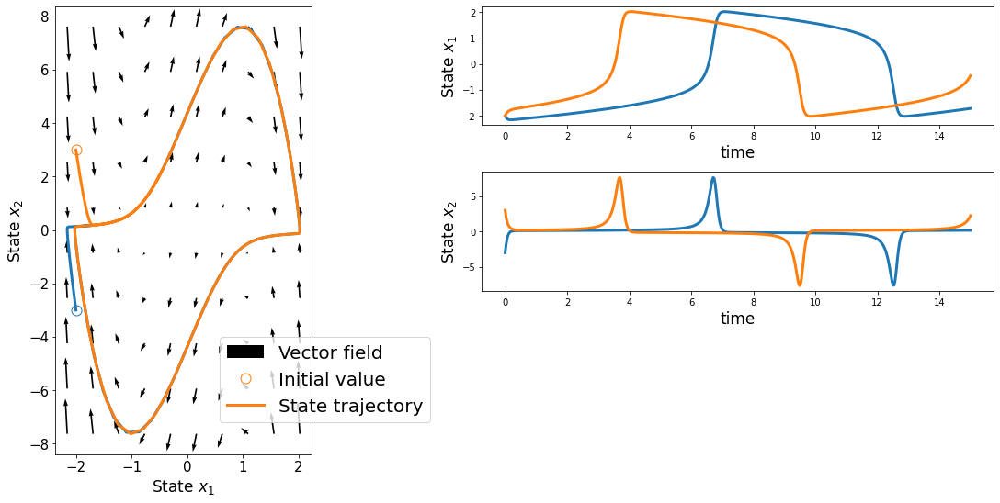

In [4]:
# feel free to modify the parameter
vdp = VDP(5.0).to(device)

# feel free to try out different initial values
x0 = torch.tensor(
    [[-2.0,-3.0],[-2.0,3.0]]
).float().to(device)

# integration time points, of shape [T]
ts = torch.linspace(0., 15., 500).to(device)

# forward integration
with torch.no_grad():
    X = odeint(vdp, x0, ts) # [T,N,D]

plot_ode(ts,X,vdp)

## 2. Neural ODE (NODE)

To motivate the neural ODEs, imagine that we observe a sequence $\mathbf{y}_{0:N}$ that is generated by a continuous-time system (the sequence could be the measurements from a physical system, motion of objects, ﬂow of electric current, substance rates in a chemical reaction, etc). How can we find the time evolution of such observed systems?

 - If we know the underlying ODE (such as the VDP system), we can use statistics and optimization tools to estimate parameters ($\mu$).
 - What if we do not know what functional form and/or the parameters of the ODE system? We estimate the time evolution function by any function approximator (In practice, one could define GP-ODEs, linear-regression-ODEs, kernel-regression-ODEs, etc). 


### 2.1. Problem Formulation
In more concrete terms, let's say our dataset contains a noisy observed sequence $\mathbf{y}_{0:N}$ 

\begin{align}
    \mathbf{y}_n &= \mathbf{x}_n + \epsilon, \qquad \epsilon\sim\mathcal{N}(0,\sigma^2),
\end{align}

where each observation is a perturbation of an unknown state $\mathbf{x}_n$ generated by an unknown underlying vector field $\mathbf{f}_\text{true}$

\begin{align}
	\mathbf{x}_n &= \mathbf{x}_0 + \int_0^{t_n} \mathbf{f}_\text{true}(\mathbf{x}_\tau)~d\tau.
\end{align}

Our goal is to learn a neural network $\mathbf{f}_\mathbf{w}$ with parameters $\mathbf{w}$ that matches the unknown dynamics:


$$\mathbf{f}_\mathbf{w} \approx \mathbf{f}_\text{true}.$$


Let's start by implementing a NODE system. We use a simple multi-layer perceptron with two hidden layers. Since vector fields are smooth, we opt for the smooth `ELU` activation instead of `ReLU`.


In [5]:
class NODE(nn.Module):
    def __init__(self, d):
        ''' d - ODE dimensionality '''
        super().__init__()
        self._f = nn.Sequential(nn.Linear(d,200), 
                                nn.ELU(), 
                                nn.Linear(200,200), 
                                nn.ELU(), 
                                nn.Linear(200,d))
    
    def ode_rhs(self, t, x):
        ''' differential function = f(x)'''
        return self._f(x)
    
    def forward(self, ts, x0, method='dopri5'):
        ''' Forward integrates the NODE system and returns state solutions
            Input
                ts - [T]   time points
                x0 - [N,d] initial value
            Returns
                X  - [T,N,d] forward simulated states
        '''
        return odeint(self.ode_rhs, x0, ts, method=method)

Now, let's see what the forward trajectory $\mathbf{x}_{0:N}$ looks like when the differential function $\mathbf{f}_\mathbf{w}$ is a NN with randomly initialized weights $w_i \sim \mathbb{U}(-k,k)$. Here, $\mathbb{U}$ and $k$ denote the uniform distribution and the number of input features. As you will see below, small random weights typically translate into smooth and small functions outputs, making the initial trajectory smooth as well. 


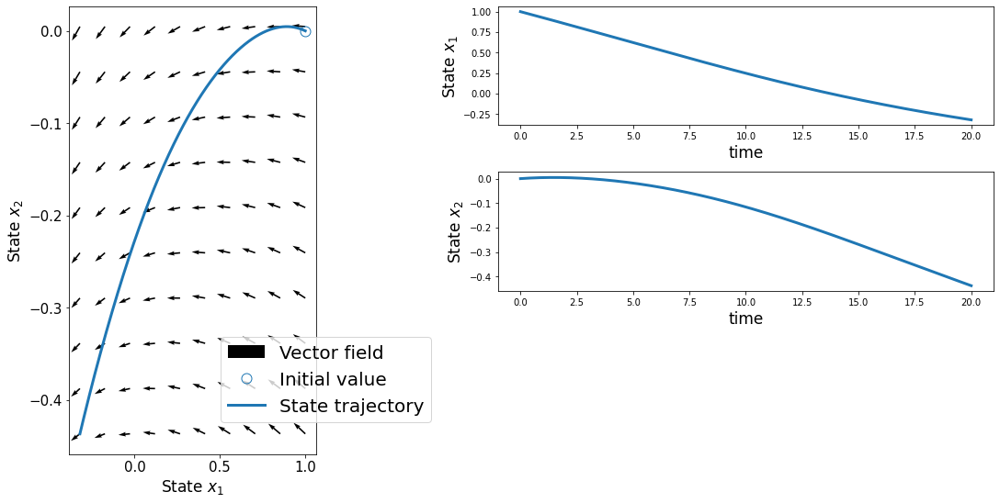

In [6]:
node = NODE(2).to(device)

# let's compute the integral of our neural net!
x0 = torch.tensor([[1.0,0.0]]).float().to(device)
ts = torch.linspace(0., 20., 1000).to(device)

X = node(ts,x0)
plot_ode(ts, X, node.ode_rhs)

### 2.2. Maximum Likelihood Estimation

The simplest approach to approximate the unknown vector field $\mathbf{f}_\text{true}$ is the maximum-likelihood estimation. Since we do not have access to the vector field $\mathbf{f}_\text{true}$, we propose to match the forward simulated states with the observations:

\begin{align}
	\min_\mathbf{w} ~~ \mathcal{L} = \frac{1}{2} \sum_n ||\mathbf{y}_n-\mathbf{x}_n||_2^2 \qquad \text{s.t.} \qquad \mathbf{x}_n = \mathbf{x}_0 + \int_0^{t_n} \mathbf{f}_\mathbf{w}(\mathbf{x}_\tau)~d\tau.
\end{align}

Observe that forward simulated states $\mathbf{x}(t)$ are functions of NN parameters $\mathbf{w}$. In the following, we show the dependency explicitly by using $\mathbf{x}(t_n;\mathbf{w})$ instead of $\mathbf{x}_n$. The gradient of the loss wrt $\mathbf{w}$ can be computed by chain rule:

\begin{align}
    \frac{d\mathcal{L}}{d\mathbf{w}} = \sum_n (\mathbf{x}(t_n;\mathbf{w})-\mathbf{y}_n) \frac{d\mathbf{x}(t_n;\mathbf{w})}{d\mathbf{w}}
\end{align}

The second term is the derivative of the forward simulated state $\frac{d\mathbf{x}(t_n;\mathbf{w})}{d\mathbf{w}}$ against the vector field parameters $\mathbf{w}$. In other words, we need to compute the derivative through the ODE solver, which is not a straightforward task. This can be done by **forward sensitivity** or **adjoints** equations. Both techniques compute the gradient by solving a second ODE system. Due to its lower memory footpring, `torchdiffeq` library implements the latter.

### 2.3. Example: Learning VDP Sequences with NODE

Next, we test our NODE system on noisy VDP sequences. To generate data, we randomly pick 10 initial values and forward integrate all trajectories concurrently. Luckily, this only requires setting the initial values and the rest of the implementation stays the same.


Plotting the first 3 data sequences.


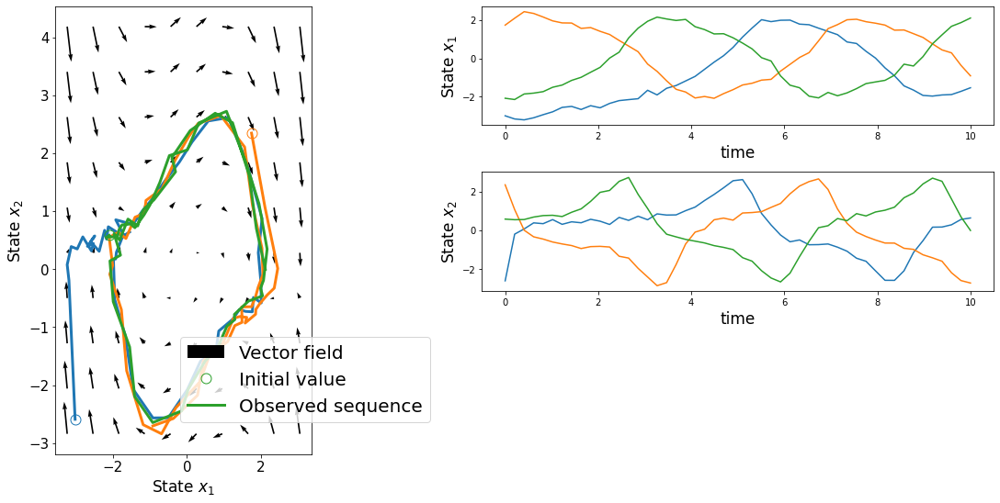

In [7]:
# lets first generate data
vdp = VDP(1.0).to(device)
x0 = 6*torch.rand([10,2]).to(device) - 3 # 10 random initial values in [-3,3]
tvdp = torch.linspace(0., 10., 50).to(device)
with torch.no_grad():
    Xvdp = odeint(vdp, x0, tvdp)
    Yvdp = Xvdp + torch.randn_like(Xvdp)*0.1 # noisy data with observation noise has std 0.1

plot_vdp_trajectories(tvdp, Yvdp, vdp)

We now train the model on the observed sequences. To speed up the training, we optimize for a subsequence instead of the whole sequence (see `get_minibatch` function in `odevae_utils.py`).


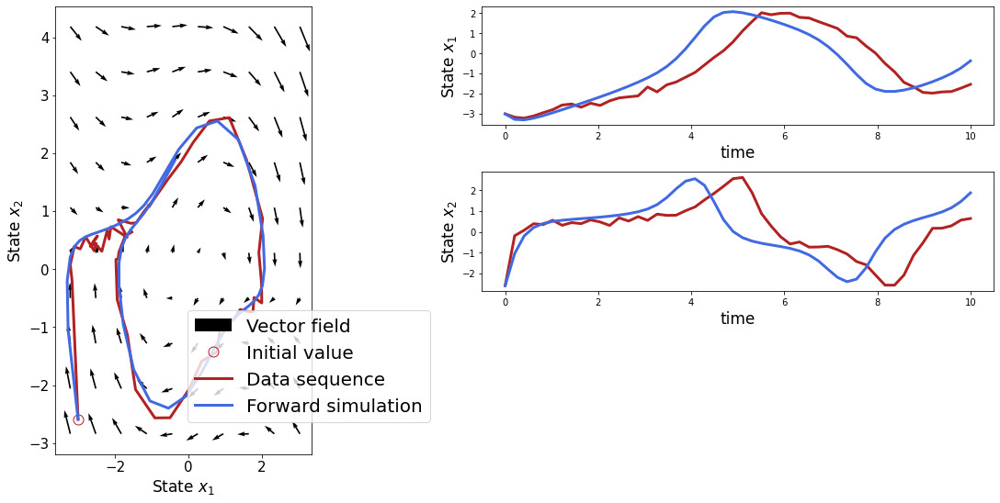

In [8]:
# optimization loop
Niter  = 1000 # number of optimization iterations
tsub   = 10   # subsequence length in each minibatch

optimizer = torch.optim.Adam(node.parameters(),1e-3)
for i in range(Niter):
    optimizer.zero_grad()
    t_,Y_ = get_minibatch(tvdp, Yvdp, tsub=tsub)
    Xhat = node(t_, Y_[0]) # forward simulation
    loss = ((Xhat-Y_)**2).mean() # MSE
    loss.backward()
    optimizer.step()
    if i%50==0:
        Xhat = node(tvdp, Yvdp[0]) # forward simulation
        display.clear_output(wait=True)
        plot_ode(tvdp, Yvdp, node.ode_rhs, Xhat.detach())

Finally, let's load and visualize a trained model.


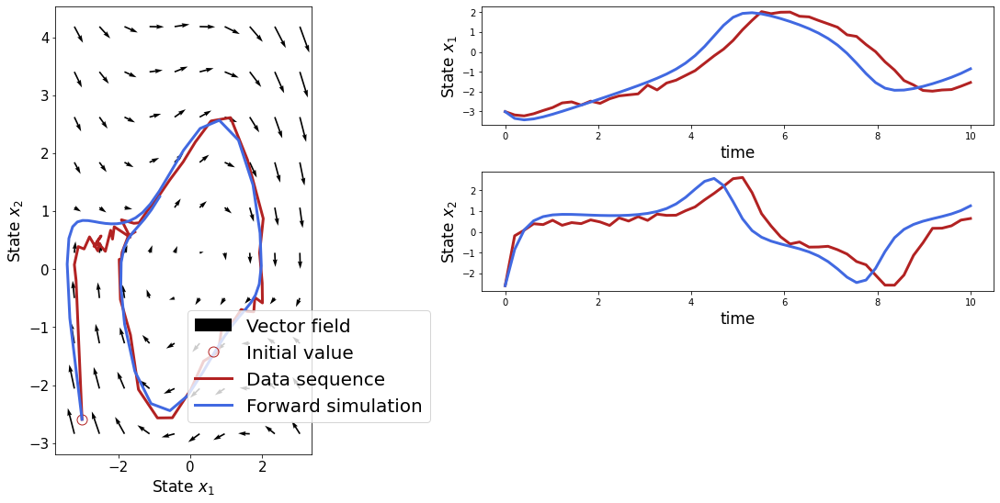

In [9]:
state_dict = torch.load('etc/trained_node.pkl')
node.load_state_dict(state_dict)
node.eval()

Xhat = node(tvdp, Yvdp[:,0]) # forward simulation
plot_ode(tvdp, Yvdp, node.ode_rhs, Xhat.detach())

### 2.4. Break: NN Differential Function and/or Adjoints

For this break, we have two suggestions to look into:
- If you would like to play around with the differential function, go ahead and try out shallower/deeper nets, other activations, smaller/larger weight initializations, etc.
- If you are more into theory, take a look at the adjoints, which are the ODEs that give us the gradients of an ODE system. You can read Section 2.1 of [this tutorial](https://cs.stanford.edu/~ambrad/adjoint_tutorial.pdf) or Sections 1 and 3 of [this techical report](https://bartlettroscoe.github.io/publications/TransientSensitivitiesDerivation.pdf) for a derivation of adjoints.

## 3. Latent Bayesian Neural ODEs (ODEVAE)

All the ODE systems we investigated so far are defined in data space, i.e., the data and the differential equation system are defined in the same space. As an example that contradicts with this modeling choice, consider the video of a flying ball. The motion of the ball can surely be explained by an ODE; however, observations themselves (pixels) do not follow any ODE at all. To handle such cases, a reasonable modeling choice is to simultaneously learn an embedding of the videos into a latent space and learn a latent ODE system that explains the motion. 

A suitable generative model for a given high-dimensional observed sequence $\mathbf{y}_{0:N}$ could be as follows:

\begin{align}
    \mathbf{z}_0 &\sim p(\mathbf{z}_0) \\
    \mathbf{z}_n &= \mathbf{z}_0 + \int_0^{t_n} \mathbf{f}_\text{true}(\mathbf{z}_\tau) d\tau \\
    \mathbf{y}_n &\sim p(\mathbf{y}_n | \mathbf{z}_n), \quad \forall n \in [0,N]
\end{align}

where $\mathbf{z}_n$ corresponds to latent embedding for $\mathbf{y}_n$. The unknowns are 
 - the initial value for each sequence
 - the latent dynamics
 - the observation mapping.  

### 3.1. Variational Inference
As before, we propose to infer the unknown dynamics $\mathbf{f}_\text{true}$ by a NODE system $\mathbf{f}_\mathbf{w}$. This time, our goal is to maintain uncertainty estimates over both the initial value and ODE dynamics. For this, we resort to VI with the following approximations:
 - amortized inference (encoder) to approximate the initial value distribution $q(\mathbf{z}_0|\mathbf{y}_{0:N})$ for an input sequence $\mathbf{y}_{0:N}$
 - mean-field inference $q(\mathbf{w})$ for the dynamics parameters
 - a decoder $\mathbf{d}(\mathbf{z}_n)$ that gives the parameters of the observation mapping $p(\mathbf{y}_n | \mathbf{z}_n)$.
 
In turn, the resulting formulation becomes a hybrid ODE-VAE model. Our variational posterior factorizes as follows:


$$ q(\mathbf{z}_0,\mathbf{w}|\mathbf{y}_{0:N}) = q(\mathbf{z}_0|\mathbf{y}_{0:N}) ~ q(\mathbf{w}),$$


where both distributions are assumed to be Gaussian with diagonal covariance. <br>
**Remark-1:** Extensions to multiple sequences would require variational posteriors for all initial values $\{\mathbf{z}_{0}^{(r)}\} _{r=1}^R$. 

**Remark-2:** Our variational formulation corresponds to having a Bayesian NN differential function, i.e., BNODEs. The stocasticity of BNNs (meaning that each evaluation of a BNN on the same input would give a different output) violates ODE definition (which requires the differential function to be continuous). Therefore, our framework first draw samples from the differential function, and then uses the function draw(s) to solve ODE systems. 

### 3.2. Evidence Lower-bound
Following the standard ELBO derivations, we end up at the following bound:

\begin{align}
    \log p(\mathbf{y}_{0:N}) \geq \sum_n \mathbb{E}_{q(\mathbf{z}_0,\mathbf{w}|\mathbf{y}_{0:N})}[\log p(\mathbf{y}_n|\mathbf{z}_0,\mathbf{w})] - \text{KL}(q(\mathbf{z}_0 | \mathbf{y}_{0:N}) || p(\mathbf{z}_0)) - \text{KL}(q(\mathbf{w}) || p(\mathbf{w})).
\end{align}

Thanks to Gaussian posteriors, KL terms are tractable. The intractable expected log-likelihood is approximated by Monte Carlo sampling:

\begin{align}
    \mathbb{E}_{q(\mathbf{z}_0,\mathbf{w}|\mathbf{y}_{0:N})}[\log p(\mathbf{y}_{0:N} |\mathbf{z}_0,\mathbf{w})] \approx \frac{1}{L} \sum_{l=1}^L \sum_{n=0}^N  \log p(\mathbf{y}_n|\mathbf{z}_0^{(l)},\mathbf{w}^{(l)}).
\end{align}

The following procedure specifies how to compute the likelihood given the samples $\mathbf{z}_0^{(l)}$ and $\mathbf{w}^{(l)}$:

1. Drawing an initial value and a vector field sample
\begin{align}
    \mathbf{z}_0^{(l)} &\sim q(\mathbf{z}_0|\mathbf{y}_{0:N}) \\
    \mathbf{w}^{(l)} &\sim q(\mathbf{w})
\end{align}

2. Forward simulating
\begin{align}
    \mathbf{z}_n^{(l)} = \mathbf{z}_0^{(l)} + \int_0^{t_n} \mathbf{f}_{\mathbf{w}^{(l)}}(\mathbf{z}_\tau)~d\tau
\end{align}

3. Decoding
\begin{align}
    \mathbf{x}_n^{(l)} &\equiv \mathbf{d}(\mathbf{z}_n^{(l)}), \quad \forall n \in [0,N].
\end{align}

**Remarks:**
1. We consider a mean-field approximation for differential function parameters.
2. Initial value distribution $q(\mathbf{z}_0|\mathbf{y}_{0:N})$ is also a diagonal Gaussian whose mean and variance parameters are given by the encoder NN.
3. The ELBO is jointly optimized wrt encoder, bnode and decoder parameters.

### 3.3. Example Dataset: Rotating MNIST

In the following example, our dataset consists of rotating MNIST digit 3. Since each pixel value is restricted to $[0,1]$, we opt for a Bernoulli observation model instead of Gaussian:


$$\log p(\mathbf{y} | \mathbf{x}) = \sum_n y_n\log x_n + (1-y_n)\log(1-x_n), \qquad \mathbf{x}=\mathbf{d}(\mathbf{z}),$$


where index $n$ denotes the observation dimensions (not the time index).

The following cell reads the dataset.


Plotting 5 rotating MNIST sequences.


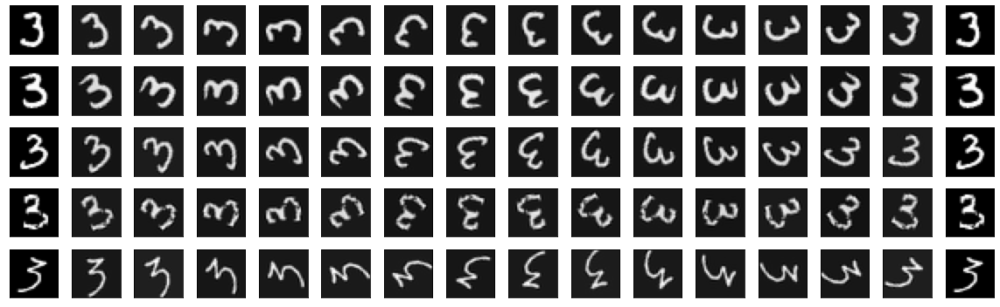

In [11]:
# we read 1042 sequences of length 16, where each observation is a 28x28 grey-scale image
Ymnist_tr, Ymnist_test = load_rotating_mnist(device) # [T,N,1,28,28]
plot_mnist_sequences(Ymnist_tr)

# let's create artificial time points corresponding to rotation angles <===> T=16
tmnist = 0.1*torch.arange(16).to(device) 

### 3.4. Implementation
We now implement our `ODEVAE` class. If you would like to learn more about the encoder and decoder implementation details, check out `vae_utils.py`. 


In [12]:
from torch.distributions import Normal, kl_divergence

class ODEVAE(nn.Module):
    def __init__(self, q, n_filt=16):
        ''' Inputs:
                q      - latent dimensionaliy
                n_filt - number of filters in the first CNN layer
        '''
        super().__init__()
        self.encoder  = MNIST_Encoder(q, n_filt)
        self.bnode    = BNN(n_in=q, n_out=q, n_hid_layers=2, n_hidden=100, act='elu')
        self.decoder  = MNIST_Decoder(q, n_filt)
        self.obs_loss = nn.BCELoss(reduction='sum')
        self.q        = q
        
    def forward(self, ts, Y, method='dopri5'):
        ''' Performs encoding, latent forward integration and decoding.
            Note that we always draw a single sample from the encoder to improve the readibility of our code.
            Inputs:
                ts - [T]           observation time points
                Y  - [T,N,1,28,28] input sequences
            Returns:
                q_z0_mu  - [N,q]           initial value means
                q_z0_sig - [N,q]           initial value std
                zt       - [T,N,q]       latent trajectoy
                Xhat     - [T,N,1,28,28] reconstructions
        '''
        [T,N,nc,d,d] = Y.shape
        # encode mean and variance
        q_z0_mu, q_z0_sig = self.encoder(Y) # N,q & N,q
        # sample differential function
        f = self.bnode.draw_f()
        ode_rhs = lambda t,x: f(x)
        # sample initial values
        z0 = q_z0_mu + q_z0_sig*torch.randn_like(q_z0_sig)
        # forward integrate
        zt = odeint(ode_rhs, z0, ts, method=method) # T,N,q
        # decode
        Xhat = self.decoder(zt) # T,N,nc,d,d
        return q_z0_mu, q_z0_sig, zt, Xhat

odevae = ODEVAE(q=8).to(device)

Now let's implement the ELBO.


In [13]:
def compute_elbo(odevae, ts, Y):
    ''' Computes the ELBO.
        Note that we always draw a single sample from the encoder to improve the readibility of our code.
        Inputs:
            ts - [T] observation time points
            Y  - [T,N,1,28,28] input sequences
        Returns:
            rec    - [] expected log likelihood
            kl_enc - [] the KL term due to z_0 
            kl_bnn - [] the KL term due to bnn weights w
    '''
    q_z0_mu, q_z0_sig, zt, Xhat = odevae(ts, Y)
    # reconstruction
    rec = -odevae.obs_loss(Xhat,Y)
    # KL divergence on z_0
    q_z0_mu, q_z0_sig = q_z0_mu.reshape(-1), q_z0_sig.reshape(-1)
    q = Normal(q_z0_mu,q_z0_sig)
    N = Normal(torch.zeros_like(q_z0_mu),torch.ones_like(q_z0_sig))
    kl_enc = kl_divergence(q,N).sum()
    # KL divergence on bnn weights
    kl_bnn = odevae.bnode.kl()
    return rec, kl_enc, kl_bnn

We finally train the model.


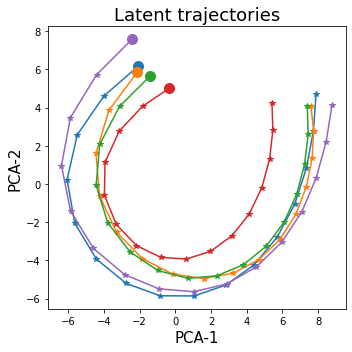

Plotting 5 rotating MNIST sequences (top rows) and corresponding predictions (bottom).


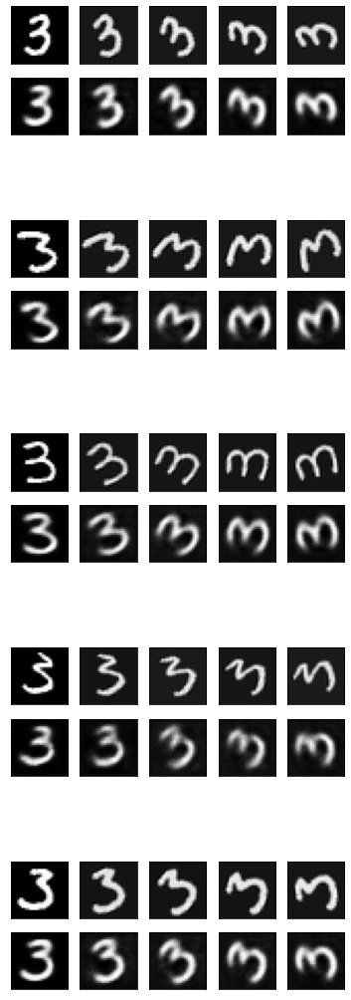

KeyboardInterrupt: 

In [14]:
Nsub  = 25  # number of sequences in each minibatch
C     = Ymnist_tr.shape[0] / Nsub # scaling factor
Niter = 2000

optimizer = torch.optim.Adam(odevae.parameters(), 1e-3)

for i in range(Niter):
    optimizer.zero_grad()
    t_,Y_ = get_minibatch(tmnist, Ymnist_tr, Nsub=Nsub)
    rec, kl_enc, kl_bnn = compute_elbo(odevae, t_, Y_)
    rec  = rec*C 
    kl   = kl_enc*C + kl_bnn
    loss = -rec + kl
    loss.backward()
    optimizer.step()
    if i%25==0:
        with torch.no_grad():
            t_,Y_ = get_minibatch(tmnist, Ymnist_tr, Nsub=5)
            q_z0_mu, q_z0_sig, zt, Xhat = odevae(t_,Y_)
            display.clear_output(wait=True)
            plot_mnist_predictions(Y_, zt, Xhat)

The following three cells import a trained model and then plot the training and test predictions. We first visualize PCA embeddings of the latent trajectories $\mathbf{z}_{0:N}$, where each color corresponds to the embedding of one sequence. Note that a single sample is drawn from the encoder and BNN, i.e., $L=1$. We then visualize five sequences and corresponding predictions. 


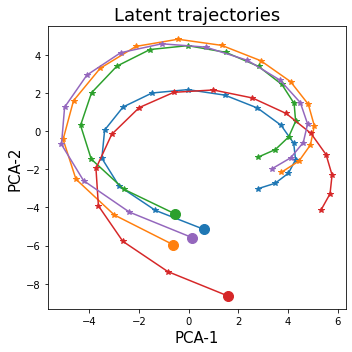

Plotting 5 rotating MNIST sequences (top rows) and corresponding predictions (bottom).


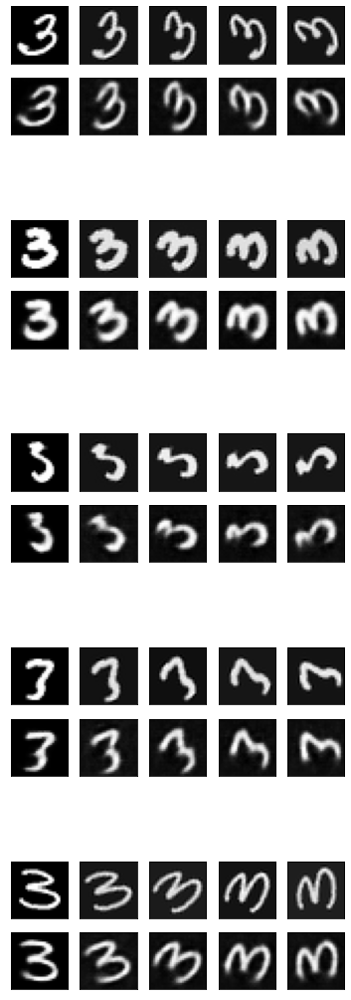

In [15]:
# load a trained model
state_dict = torch.load('etc/trained_odevae.pkl')
odevae.load_state_dict(state_dict)
odevae.eval();

t_,Y_ = get_minibatch(tmnist, Ymnist_tr, Nsub=5)
q_z0_mu, q_z0_sig, zt, Xhat = odevae(t_,Y_)
plot_mnist_predictions(Y_, zt, Xhat)

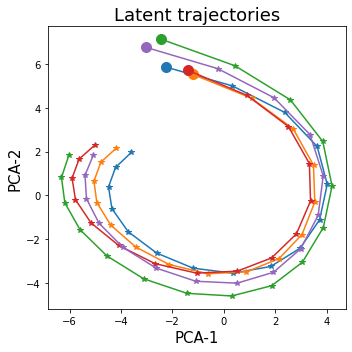

Plotting 5 rotating MNIST sequences (top rows) and corresponding predictions (bottom).


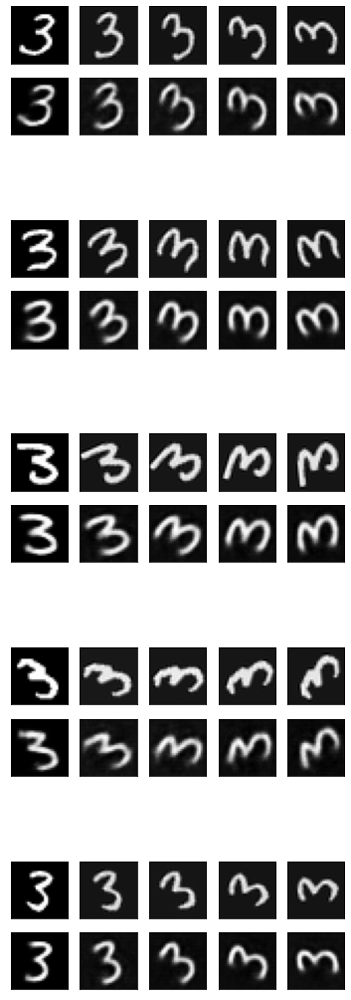

In [16]:
t_,Y_ = get_minibatch(tmnist, Ymnist_test, Nsub=5)
q_z0_mu, q_z0_sig, zt, Xhat = odevae(t_,Y_)
plot_mnist_predictions(Y_, zt, Xhat)

# 15-MIN  BREAK

My fav online radio: https://radyobozcaada.com/player/index.html

## 4. ResNets are Discretized ODEs

So far, we examined NODEs from a dynamical system standpoint. We showed that NODE is an instance of ODE models in which the differential function is a neural network. Thanks to their universal approximation guarantees, NODEs can approximate any ODE system.

Our presentation is orthogonal to the original NODE paper, which  describes the model starting from Residual Networks (ResNets). ResNet is among the first "very deep" networks to solve classification problems. In a nutshell, ResNets consist of layers with skip connections, leading to following transformation of the hidden state $\mathbf{x}_n$ at layer $n$: 

$$ \mathbf{x}_{n+1} = \mathbf{x}_n + \mathbf{f}(\mathbf{x}_n;\theta_n),$$

where $\theta_n$ corresponds to the parameters at layer $n$. As we showed previously, this update equation is equivalent to computing ODE solutions with fixed time increments $\Delta t$:

$$\mathbf{x}_{n+1} = \mathbf{x}_{n} +  \Delta t \cdot \mathbf{f}(\mathbf{x}_{n},t_n;\theta),$$

Therefore, we can interpret ResNet as a rough approximation of NODEs with fixed time increments $\Delta t$. In the following, we show how ResNets can be trivially replaced by its ODE counterpart, dubbed as "ODE Networks". Since we use adaptive step ODE solvers, which can be evaluated at any point in time, ODENets are interpreted as *infinitely deep*. <br>

![title](etc/img/resnet-vs-odenet.png)

**Note:** ResNets typically have different parameters $\theta_n$ at each layer $n$. A similar parameterization for NODEs can be achieved by explicitly parameterizing the differential function by time $n$.<br>

### 4.1. Classification Objective

Now we formulate the classification objective. Given a dataset of images and labels $\{(\mathbf{x}_n,\mathbf{y}_n)\}_{n=1}^N$, we apply the following chain of transformations:
 - downsampling (to extract relevant features)
 - feature transformation (implemented by ResNets/ODENets)
 - fully connected layers (to map transformed features into class labels)

$$
\begin{align}
	\min_\mathbf{w} ~~ \sum_n \texttt{crossentropy}(\mathbf{y}_n,\hat{\mathbf{y}}_n) \qquad \text{s.t.} \qquad \hat{\mathbf{y}} = \mathbf{f}_{\text{fc}}(\mathbf{f}_{\text{trans}}(\mathbf{f}_{\text{down}}(\mathbf{x}_n))).
\end{align}
$$

### 4.2. Implementation

We start our implementation by residual networks.


In [ ]:
class ResNet(nn.Module):
    def __init__(self, num_blocks, inplanes, planes, stride=1):
        super(ResNet, self).__init__()
        self.blocks = nn.Sequential(*[ResNetBlock(inplanes, planes) for _ in range(num_blocks)])
    
    def forward(self,x):
        return self.blocks(x)

class ResNetBlock(nn.Module):
    def __init__(self, inplanes, planes, stride=1):
        super(ResNetBlock, self).__init__()
        self.net = nn.Sequential(group_norm(inplanes), 
                                nn.ReLU(inplace=True), 
                                conv3x3(inplanes, planes, stride), 
                                group_norm(planes), 
                                nn.ReLU(inplace=True),
                                conv3x3(planes, planes))

    def forward(self, x):
        shortcut = x
        net_out  = self.net(x)
        return net_out + shortcut

Next, we implement the neural ODE block. Similar to previous section, we only implement the differential function and forward integrate. Notable differences to the time series fitting example:
 - We are only interested in the final state of the ODE system (intermediate states are not important).
 - Integration time points are completely arbitrary.
 - Inside the differential function, we concatenate the states with the current time stamp. This way, we learn time-dependent and hence much more powerful differential functions (since the differential function evaluated at two different time points are different). 


In [ ]:
class NODE(nn.Module):
    def __init__(self, dim):
        super(NODE, self).__init__()
        self.norm1 = group_norm(dim)
        self.relu  = nn.ReLU(inplace=True)
        self.conv1 = ConcatConv2d(dim, dim, 3, 1, 1)
        self.norm2 = group_norm(dim)
        self.conv2 = ConcatConv2d(dim, dim, 3, 1, 1)
        self.norm3 = group_norm(dim)
        self.integration_time = torch.tensor([0, 1]).float()

    def ode_rhs(self, t, x):
        out = self.norm1(x)
        out = self.relu(out)
        out = self.conv1(t, out)
        out = self.norm2(out)
        out = self.relu(out)
        out = self.conv2(t, out)
        out = self.norm3(out)
        return out

    def forward(self, x, method='dopri5'):
        ''' Forward integrates the NODE system and returns state solutions
            Input
                x   - [N, num_filt, w, c] initial value
            Returns
                out - [N, num_filt, w, c] the final state of the ODE system
        '''
        self.integration_time = self.integration_time.type_as(x)
        # we solve the ODE system with less tolerance (bigger error) for faster computation
        out = odeint(self.ode_rhs, x, self.integration_time, method=method, rtol=1e-3, atol=1e-6)
        return out[-1]

    
class ConcatConv2d(nn.Module):
    ''' Convolutional layers that use current time stamp information '''

    def __init__(self, dim_in, dim_out, ksize=3, stride=1, padding=0, dilation=1, groups=1, bias=True):
        super(ConcatConv2d, self).__init__()
        self._layer = nn.Conv2d(dim_in + 1, dim_out, kernel_size=ksize, stride=stride, padding=padding, 
                                dilation=dilation, groups=groups, bias=bias)

    def forward(self, t, x):
        tt  = torch.ones_like(x[:, :1, :, :]) * t
        ttx = torch.cat([tt, x], 1)  
        return self._layer(ttx)

### 4.3. Training

Next, we create the downsampling, feature transformation and final classification layers.


In [ ]:
trans_layer = 'odenet' # can be replaced with 'resnet'
num_filt    = 16

# downsampling
downsampling_layers = [
    nn.Conv2d(1, num_filt, 3, 1),
    group_norm(num_filt),
    nn.ReLU(inplace=True),
    nn.Conv2d(num_filt, num_filt, 4, 2, 1),
    group_norm(num_filt),
    nn.ReLU(inplace=True),
    nn.Conv2d(num_filt, num_filt, 4, 2, 1),
]

# feature transformation
if trans_layer=='odenet':
    feature_layers = NODE(num_filt)
else:
    feature_layers = ResNet(6, num_filt, num_filt)

    
# fully connected layer
fc_layers = [group_norm(num_filt), nn.ReLU(inplace=True), nn.AdaptiveAvgPool2d((1, 1)), Flatten(), nn.Linear(num_filt, 10)]

model = nn.Sequential(*downsampling_layers, feature_layers, *fc_layers).to(device)
print('Number of parameters: {}'.format(count_parameters(model)))

We finally load the data and start training.


In [ ]:
lr       = 0.1
niters   = 1000
batch_size  = 100
print_every = 10
test_every  = 100

train_loader, test_loader, train_eval_loader = mnist_loaders(batch_size)
data_gen = inf_generator(train_loader)

optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=0.9)
criterion = nn.CrossEntropyLoss().to(device)

start_time = time.time()

for itr in range(1,niters):
    optimizer.zero_grad()
    x, y = data_gen.__next__()
    x = x.to(device)
    y = y.to(device)
    logits = model(x)
    loss   = criterion(logits, y)
    loss.backward()
    optimizer.step()
    
    # print the train trace
    if itr % print_every == 0:
        end_time = time.time()
        print("Iter {:04d} | Time {:.3f} | loss {:.4f}".format(itr, end_time-start_time, loss.item()))
        start_time = time.time()
        
    # print the test trace
    if itr % test_every == 0:
        with torch.no_grad():
            val_acc   = mnist_accuracy(model, device, test_loader)
            train_acc = mnist_accuracy(model, device, train_eval_loader)
            print("Iter {:04d} | Train Acc {:.4f} | Test Acc {:.4f}".format(itr, train_acc, val_acc))
            start_time = time.time()

### 4.4. Break: ODE Solver Parameters

Our continuous-time classification algorithm relies on solving an intermediate ODE system.  To solve the ODE system, we use an adaptive step ODE solver named dopri5 (RK45). Just like the Euler method, dopri5 takes a finite number of steps to compute the state solutions but this time the step size $\Delta t$ adaptively changes at every step. Notice that taking small steps (= small $\Delta t$) leads to more accurate solutions, at the expense of taking more steps (= higher execution time). 

Adaptive step solvers control $\Delta t$ based on the local error made due to discretization. As you can see in the ```NODE.forward()```, we input the ODE solver with tolerance values (```rtol``` and ```atol```). Roughly speaking, these values control "how much error we can live with". In this break, you can study how changing these values affect the execution time and overall performance (please do not forget to run all three cells above for testing). You can also check out [scipy RK45 function](https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.RK45.html) to learn more about the tolerances.  

## 5. Continuous-time Normalizing Flows

### 5.1. Normalizing Flows
Next, we turn to second application of NODEs, namely continuous-time normalizing flows (CNFs). NFs is a method to build complex distributions by transforming a simple probability distribution through a fixed number of invertible mappings. In the context of NFs, the change of variables theorem describes the change in the probability of a random variable $z_0$ upon a deterministic transformation $f(z_0)$:

$$ z_1 = f(z_0), \qquad \log p(z_1) = \log p(z_0) - \log \left| \text{det} \frac{\partial f}{\partial z_0} \right|. $$


To increase the expressiveness of the transformations, we chain several transformations:

$$ z_K = f_{K-1} \circ f_{K-2} \circ \ldots \circ f_0 (z_0), \qquad \log p(z_K) = \log p(z_0) - \sum_{k=0}^{K-1} \log \left| \text{det} \frac{\partial f_k}{\partial z_{k}} \right|. $$


Here, we transform samples $z_0 \sim p(z_0)$ from a simple base distribution (such as standard Gaussian) into a more complex distribution $p(z_K)$. Once the transformations are known, we can compute any expectation $\mathbb{E}_{p(z_K)}[h(z_K)]$ as follows: 


$$\mathbb{E}_{p(z_K)}[h(z_K)] = \mathbb{E}_{p(z_0)}[h(f_{K-1} \circ f_{K-2} \circ \ldots \circ f_0 (z_0))]$$


### 5.2. Continuous-time Normalizing Flows
Similar to ODENets, CNFs is a continuous-time counterpart of standard NFs. Meaning, a simple base distribution $p(z(t_0))$ is transformed into a more complex $p(z(t_1))$ via an ODE flow:

![title](etc/img/cnf.png)

Since we replaced a finite set of transformations with an ODE, the above formula for the change in density no longer applies. Here, so-called **instantaneous change of variables** theorem kicks in. Given a random variable $z(t)$ whose probability depends on time $p(z(t))$, the change in log probability due to a continuous-time transformation $\frac{dz}{dt} = f(z(t),t)$ has the following expression:

$$ \frac{\partial \log p(z(t))}{\partial t} = -\text{tr} \left( \frac{df}{dz(t)} \right), $$

where $\text{tr}$ refers to the trace operator. Then we have:


$$ \log p(z(t_1)) = \log p(z(t_0)) - \int_{t_0}^{t_1} \text{tr} \left( \frac{df}{dz(\tau)} \right) d\tau $$


for the following ODE system:


$$ z(t_1) = z(t_0) + \int_{t_0}^{t_1} f(t,z(\tau)) d\tau$$



Below is the implementation of the trace operator:


In [ ]:
def trace_df_dz(f, z):
    """Calculates the trace of the Jacobian df/dz.
    Stolen from: https://github.com/rtqichen/ffjord/blob/master/lib/layers/odefunc.py#L13
    Input:
        f - function output [N,d]
        z - current state [N,d]
    Returns:
        tr(df/dz) - [N]
    """
    sum_diag = 0.
    for i in range(z.shape[1]):
        sum_diag += torch.autograd.grad(f[:, i].sum(), z, create_graph=True)[0].contiguous()[:, i].contiguous()
    return sum_diag.contiguous()

### 5.3. Implementation

Now we implement CNF. Our implementation heavily resembles previous NODE implementation. However, this time we concurrently compute the ODE state solutions and the log density change, both needed to optimize the flow. Consquently, the differential function takes current state and density as input and computes the time derivatives (differential function + the trace operator).

In our implementation, we consider the following time-dependent flow:

$$ \frac{dz(t)}{dt} = f(t,z(t)) = U_t ~\text{h}(W_t z(t) + b_t),$$

where h is a non-linear function and the parameters $(U_t, W_t, b_t)$ are given by a neural network. Please see ```hyper_net.py``` for the implementation. 

**Remark-1:** Any parameterized function can replace ```self.f``` below. We choose to use ```HyperNetwork``` as in the original NODE github repo. <br>
**Remark-2:** Unlike NFs, CNFs do not necessitate $f$ to be bijective since we can backward integrate the ODE system. 


In [ ]:
from hyper_net import HyperNetwork

class CNF(nn.Module):
    """Adapted from the NumPy implementation at:
    https://gist.github.com/rtqichen/91924063aa4cc95e7ef30b3a5491cc52
    """
    def __init__(self, in_out_dim, hidden_dim, width):
        super().__init__()
        self.f = HyperNetwork(in_out_dim, hidden_dim, width)

    def ode_rhs(self, t, states):
        ''' Differential function implementation. states is (x1,logp_diff_t1) where
                x1 - [N,d] initial values for ODE states
                logp_diff_t1 - [N,1] initial values for density changes
        '''
        z,logp_z = states # [N,d], [N,1]
        N = z.shape[0]
        with torch.set_grad_enabled(True):
            z.requires_grad_(True)
            dz_dt      = self.f(t,z) # [N,d] 
            dlogp_z_dt = -trace_df_dz(dz_dt, z).view(N, 1)
        return (dz_dt, dlogp_z_dt)
    
    def forward(self, ts, z0, logp_diff_t0, method='dopri5'):
        ''' Forward integrates the CNF system. Returns state and density change solutions.
            Input
                ts - [T]   time points
                z0 - [N,d] initial values for ODE states
                logp_diff_t0 - [N,1] initial values for density changes
            Retuns:
                zt -     [T,N,...]  state trajectory computed at t
                logp_t - [T,N,1]    density change computed over time
        '''
        zt, logp_t = odeint(self.ode_rhs, (z0, logp_diff_t0), ts, method=method)
        return zt, logp_t 

### 5.4. Training

Next, we visualize the dataset (samples from the target density) and train the model.


In [ ]:
# data generation
Ntrain = 10000

def get_batch(num_samples):
    points, _ = make_circles(n_samples=num_samples, noise=0.06, factor=0.5)
    return torch.tensor(points).type(torch.float32).to(device) # N,2
tr_data = get_batch(Ntrain)

plot_cnf_data(tr_data)

In [ ]:
# model and flow parameters
hidden_dim = 32
width      = 64
t0 = 0  # flow start time
t1 = 1  # flow end time

# optimization parameters
lr     = 3e-3
niters = 1000
Nsamp  = 100
print_every = 25

# model
cnf  = CNF(in_out_dim=2, hidden_dim=hidden_dim, width=width).to(device)
ts   = torch.tensor([t1, t0]).type(torch.float32).to(device) # for training, we flow the samples backward (in time) 
p_z0 = torch.distributions.MultivariateNormal(
    loc=torch.tensor([0.0, 0.0]).to(device),
    covariance_matrix=torch.tensor([[0.1, 0.0], [0.0, 0.1]]).to(device)
)

optimizer = torch.optim.Adam(cnf.parameters(), lr=lr)
for itr in range(1, niters+1):
    optimizer.zero_grad()

    # get a random sample minibatch
    idx = torch.randperm(Ntrain)[:Nsamp]
    x1  = tr_data[idx] # Nsamp,2
    
    # initialize initial densities
    logp_diff_t1 = torch.zeros(Nsamp, 1).type(torch.float32).to(device)
    
    # compute the backward solutions
    z_t,  logp_diff_t  = cnf(ts, x1, logp_diff_t1) # outputs time first
    z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]
    
    # compute the density of each sample
    logp_x = p_z0.log_prob(z_t0).to(device) - logp_diff_t0.view(-1)
    loss   = -logp_x.mean(0)
    loss.backward()
    optimizer.step()
    
    if itr%print_every==0:
        print('Iter: {}, loss: {:.4f}'.format(itr, loss.item()))

print('Training complete after {} iters.'.format(itr))

Let's visualize how the flow behaves over time:


In [ ]:
# load the pre-trained model
state_dict = torch.load('etc/trained_cnf.pkl')
cnf.load_state_dict(state_dict)
cnf.eval()

# samples
viz_samples   = 30000
viz_timesteps = 41
target_sample = get_batch(viz_samples)

# simulate the flow
with torch.no_grad():
    # Generate evolution of samples
    z_t0 = p_z0.sample([viz_samples]).to(device)
    logp_diff_t0 = torch.zeros(viz_samples, 1).type(torch.float32).to(device)

    ts = torch.tensor(np.linspace(t0, t1, viz_timesteps)).to(device)
    z_t_samples, _  = cnf(ts, z_t0, logp_diff_t0)

    # Generate evolution of density
    x = np.linspace(-1.5, 1.5, 100)
    y = np.linspace(-1.5, 1.5, 100)
    points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T
    
    z_t1 = torch.tensor(points).type(torch.float32).to(device)
    logp_diff_t1 = torch.zeros(z_t1.shape[0], 1).type(torch.float32).to(device)
    ts = torch.tensor(np.linspace(t1, t0, viz_timesteps)).to(device)
    z_t_density, logp_diff_t = cnf(ts, z_t1, logp_diff_t1)

anim = plot_cnf_animation(target_sample, t0, t1, viz_timesteps, p_z0, z_t1, z_t_samples, z_t_density, logp_diff_t)
display.HTML(anim.to_jshtml())

### 5.5. Break: Wrap-off
This is our last break in this tutorial. Use this time to go through the entire lecture material to get ready for the upcoming Q&A session. Alternatively, you can dive deeper into CNFs, e.g., by changing the differential function, integration length, etc.

## 6. Related Studies

### 6.1. ODE-RNN [[rubanova2019latent]](#References)
Vertical lines show observation times. Standard RNNs have constant or undefined hidden states between observations. States of Neural ODE follow a complex trajectory but are determined by the initial state. The ODE-RNN model has states which obey an ODE between observations, and are also updated at observations.

![title](etc/img/ode-rnn.png)

### 6.2. ODE$^2$VAE [[yildiz2019deep]](#References)

The model explicitly decomposes the latent space into momentum and position components and solves a second order ODE system. Latent ODE dynamics parameterized by deep Bayesian neural networks.

![title](etc/img/ode2vae.png)

### 6.3. Augmented NODEs [[dupont2019augmented]](#References)
NODEs learn homeomorphisms so that the features of Neural ODEs preserve the topology of the input space. This implies that NODEs can only continuously deform the input space and cannot for example tear a connected region apart. The paper introduces Augmented
Neural ODEs (ANODEs), which augment the space on which the ODE is solved, allowing the model to use the additional dimensions to learn more complex functions using simpler flows.

|![alt](etc/img/anode1.png) |![alt](etc/img/anode2.png)|
|-|-|

### 6.4. Regularized NODEs [[finlay2020train]](#References)

Adaptive numerical ODE solvers could take very small steps, which in practice leads to dynamics equivalent to many hundreds of layers. Levaraging the connections with optimal transport, the paper shows that regularizing the Jacobian of the differential function leads to simpler vector fields that can be trained much faster while still achieving the same accuracy.

![title](etc/img/rnode.png)

### 6.5. ACA [[zhuang2020adaptive]](#References)

The adjoint method has numerical errors in reverse-mode integration (for gradient computation) as can be seen from the below images. The paper presents the Adaptive Checkpoint Adjoint (ACA) method: in automatic differentiation, ACA applies a trajectory checkpoint strategy which records the forward-mode trajectory as the reverse-mode trajectory to guarantee accuracy. 

![title](etc/img/aca.png)

### 6.6. ODE-RL [[yildiz2021continuous]](#References)
Model-based reinforcement learning (MBRL) approaches rely on discrete-time state transition models whereas physical systems and the vast majority of control tasks operate in continuous-time. This work presents a new perspective for RL in which the dynamics are approximated by an ensemble of NODEs. The authors also introduce a novel actor-critic algorithm for policy learning to address the fact that Q-functions vanish in continuous time.

![title](etc/img/ode-rl.png)

### 6.7. NSDEs [[tzen2019neural], [xu2022infinitely]](#References)

Deep latent Gaussian models combine deterministic transformation of random variables with small independent Gaussian perturbation. This paper shows that if the number of layers tends to infinity, the limiting latent object is an Itô diffusion process that solves a stochastic differential equation (SDE). [[tzen2019neural]](#References) develops a variational inference framework for these neural SDEs via stochastic automatic differentiation in Wiener space. Later [[xu2022infinitely]](#References) defines a stochastic process (NSDE) on the weights of a BNN, leading to so-called "infinitely deep BNNs".

![title](etc/img/nsde.png)

### 6.8. GP-ODEs [[hegde2022variational]](#References)
A novel Bayesian nonparametric model that uses Gaussian processes to infer posteriors of unknown ODE systems. The method uses sparse variational inference with decoupled functional sampling to represent vector field posteriors.

![title](etc/img/gpodes.png)

## References

*URLs in blue.*

[[chen2018neural]](https://papers.nips.cc/paper/2018/hash/69386f6bb1dfed68692a24c8686939b9-Abstract.html) Chen, Ricky TQ, et al. "Neural ordinary differential equations." NeurIPS (2018).

[[rubanova2019latent]](https://arxiv.org/abs/1907.03907) Rubanova, Y., Chen, R. T., and Duvenaud, D. "Latent odes for irregularly-sampled time series (2019)." arXiv preprint arXiv:1907.03907 (1907).

[[yildiz2019deep]](https://arxiv.org/abs/1905.10994)  Yildiz, C., Heinonen, M., and Lähdesmäki, H. "ODE2VAE: Deep generative second order ODEs with Bayesian neural networks." NeurIPS (2019).

[[tzen2019neural]](https://arxiv.org/abs/1905.09883)  Tzen, B., & Raginsky, M. (2019). Neural stochastic differential equations: Deep latent gaussian models in the diffusion limit. arXiv preprint arXiv:1905.09883.

[[dupont2019augmented]](https://arxiv.org/abs/1904.01681) Dupont, E., Doucet, A., & Teh, Y. W. (2019). Augmented neural odes. Advances in Neural Information Processing Systems, 32.

[[finlay2020train]](https://arxiv.org/abs/2002.02798)  Finlay, C., Jacobsen, J. H., Nurbekyan, L., & Oberman, A. (2020, November). How to train your neural ODE: the world of Jacobian and kinetic regularization. In International conference on machine learning (pp. 3154-3164). PMLR.

[[zhuang2020adaptive]](https://arxiv.org/abs/2006.02493) Zhuang, J., Dvornek, N., Li, X., Tatikonda, S., Papademetris, X., & Duncan, J. (2020, November). Adaptive checkpoint adjoint method for gradient estimation in neural ode. In International Conference on Machine Learning (pp. 11639-11649). PMLR.

[[yildiz2021continuous]](https://arxiv.org/abs/2102.04764)  Yildiz, C., Heinonen, M., & Lähdesmäki, H. (2021, July). Continuous-time Model-based Reinforcement Learning. In International Conference on Machine Learning (pp. 12009-12018). PMLR.

[[xu2022infinitely]](https://arxiv.org/pdf/2102.06559.pdf)  Xu, W., Chen, R. T., Li, X., & Duvenaud, D. (2022, May). Infinitely deep bayesian neural networks with stochastic differential equations. In International Conference on Artificial Intelligence and Statistics (pp. 721-738). PMLR.

[[hegde2022variational]](https://arxiv.org/abs/2106.10905)  Hegde P., Yildiz, C., Lähdesmäki, H., Kaski, S., & Heinonen, M. (2022, February). Variational multiple shooting for Bayesian ODEs with Gaussian processes. In The 38th Conference on Uncertainty in Artificial Intelligence.
